# Downloading `lambo`'s data and repairing the resulting `pdb`s

This notebook downloads the data for the `RFP` task in `lambo`, following their instructions instead of relying on their code. The end result are the repaired versions of the longest chains of the proteins they describe (under `./repaired_pdbs`), as well as their respective crystal `pH` values in `./pH.json`.

Citing them almost verbatim, they search the [FPBase]() for proteins that
- emit light of wavelenghts $\geq 580$ nm, and
- have a length of less than 244 residues, and
- have known 3D structure.

Let's start by doing this, too.

In [34]:
fpbase_api_endpoint = "https://www.fpbase.org/api/proteins"

In [35]:
import requests

res = requests.get(f"{fpbase_api_endpoint}/?default_state__em_max__gte=580&format=json")

Let's understand this data a bit more, and explore e.g. the distribution of sequence lengths:

In [36]:
import pandas as pd
import seaborn as sns

sns.set(style='whitegrid')

def length_if_not_none(sequence):
    if sequence is None:
        return float("nan")
    else:
        return len(sequence)

df = pd.DataFrame(res.json())
df["sequence_length"] = df["seq"].apply(length_if_not_none)

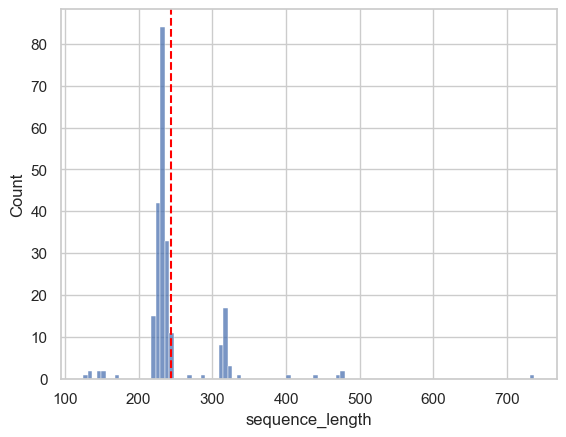

In [37]:
import matplotlib.pyplot as plt


_, ax = plt.subplots(1, 1)
sns.histplot(df["sequence_length"], ax=ax, bins=100)
ax.axvline(244, color="red", linestyle="--", label="Their cutoff")

Let's count how many they have on this one, and whether they compare with `lambo`'s description. Unforunately, they are not clear about the numbers. Closest thing we have are their folders of preprocessing: they pre-process 50 proteins.

In [38]:
import numpy as np

In [39]:
their_dataset = df[
    np.logical_and(
        df["sequence_length"] <= 244,  # Their cutoff
        df["pdb"].apply(length_if_not_none) > 0 # Having a known 3D structure (?)
    )
]

In [40]:
len(their_dataset)

47

We end up being three short. Let's check to see if we find which three exaclty.

In [41]:
# pypdb is a Python wrapper for the RCSB Protein Data Bank RESTful API.
import pypdb

pdbs_to_download = []
pHs = {}
for pdb_list in their_dataset["pdb"]:
    if pdb_list is None:
        continue
    elif len(pdb_list) == 0:
        continue
    elif len(pdb_list) == 1:
        pdb_id = pdb_list[0]
        pdb_info = pypdb.get_info(pdb_id)
        pdbs_to_download.append(pdb_list[0].upper())
        if "exptl_crystal_grow" in pdb_info:
            pHs[pdb_id] = pdb_info["exptl_crystal_grow"][0].get("p_h", None)
        else:
            pHs[pdb_id] = None
        continue

    resolutions_and_pHs = {}
    for i, pdb_id in enumerate(pdb_list):
        pdb_info = pypdb.get_info(pdb_id)
        resolutions_and_pHs[pdb_id] = (
            pdb_info["rcsb_entry_info"].get("resolution_combined", np.inf),
            pdb_info["exptl_crystal_grow"][0]["p_h"] if "exptl_crystal_grow" in pdb_info else None,
        )
    
    pdb_with_minimal_resolution = min(resolutions_and_pHs.items(), key=lambda x: x[1][0])
    pdbs_to_download.append(pdb_with_minimal_resolution[0].upper())
    pHs[pdb_with_minimal_resolution[0]] = pdb_with_minimal_resolution[1][1]

In [42]:
len(pHs)

47

In [43]:
len(pdbs_to_download)

47

Let's compare these with the folders in `lambo`:

In [44]:
from pathlib import Path

# /Users/sjt972/Projects/lambo/lambo/assets/foldx
PATH_TO_LAMBO = Path("/Users/sjt972/Projects/lambo")
path_to_protein_assets = PATH_TO_LAMBO / "lambo" / "assets" / "foldx"

In [45]:
pdb_ids_in_lambo = []
for folder in path_to_protein_assets.iterdir():
    if folder.is_dir():
        pdb_ids_in_lambo.append(folder.stem.split("_")[0].upper())

In [46]:
len(pdb_ids_in_lambo)

50

Let's get the symmetric difference

In [47]:
pdbs_in_ours_and_not_in_theirs = [pdb_id for pdb_id in pdbs_to_download if pdb_id not in pdb_ids_in_lambo]
pdbs_in_theirs_and_not_in_ours = [pdb_id for pdb_id in pdb_ids_in_lambo if pdb_id not in pdbs_to_download]

In [48]:
print(pdbs_in_ours_and_not_in_theirs)

['3E5T', '4JGE', '7OIN', '3IR8', '7ZCT', '4NWS']


In [49]:
print(pdbs_in_theirs_and_not_in_ours)

['4Q7U', '3U0K', '4Q7T', '4CQH', '3S7Q', '5AJG', '3S05', '4P76', '1ZTU']


The differences are somewhat substantial. Moreover, they had a typo in their preprocessing which rendered all pH values to be 7.0... There are several proteins that were studied in different pH values:

In [50]:
for pdb_id in pdb_ids_in_lambo[:20]:
    pH = pHs.get(pdb_id, None)
    if pH is not None and pH != 7.0:
        print(f"{pdb_id}, pH {pH}")

3U8C, pH 5.5
4H3L, pH 6.5
2VAD, pH 7.6
5JVA, pH 8.5
3NT9, pH 5.6
5EZ2, pH 5.5
2H5R, pH 10.5
2VVH, pH 8.4
5DTL, pH 9.0
3U0L, pH 4.5
3NEZ, pH 6.5
3M22, pH 8.8


Let's download our dataset, with proper pHs.

In [51]:
from Bio.PDB import PDBList

THIS_DIR = Path().resolve()
DOWNLOAD_PATH = THIS_DIR / "raw_pdbs"
DOWNLOAD_PATH.mkdir(exist_ok=True)

pdbl = PDBList()
pdbl.download_pdb_files(
    pdbs_to_download,
    pdir=DOWNLOAD_PATH,
    file_format="pdb"
)

Structure exists: '/Users/sjt972/Projects/poli-baselines/examples/09_replicating_nsga_ii_of_lambo/raw_pdbs/pdb6aa7.ent' 
Structure exists: '/Users/sjt972/Projects/poli-baselines/examples/09_replicating_nsga_ii_of_lambo/raw_pdbs/pdb1xqm.ent' 
Structure exists: '/Users/sjt972/Projects/poli-baselines/examples/09_replicating_nsga_ii_of_lambo/raw_pdbs/pdb3rwa.ent' 
Structure exists: '/Users/sjt972/Projects/poli-baselines/examples/09_replicating_nsga_ii_of_lambo/raw_pdbs/pdb1zgo.ent' 
Structure exists: '/Users/sjt972/Projects/poli-baselines/examples/09_replicating_nsga_ii_of_lambo/raw_pdbs/pdb2vad.ent' 
Structure exists: '/Users/sjt972/Projects/poli-baselines/examples/09_replicating_nsga_ii_of_lambo/raw_pdbs/pdb2v4e.ent' 
Structure exists: '/Users/sjt972/Projects/poli-baselines/examples/09_replicating_nsga_ii_of_lambo/raw_pdbs/pdb2vae.ent' 
Structure exists: '/Users/sjt972/Projects/poli-baselines/examples/09_replicating_nsga_ii_of_lambo/raw_pdbs/pdb1uis.ent' 
Structure exists: '/Users/sjt972

Let's save the pH values as well:

In [52]:
import json

with open(THIS_DIR / "pHs.json", "w") as f:
    json.dump(pHs, f)

They also only keep the longest chain. Let's prepare the pdb files for this.

In [54]:
from Bio.PDB import PDBParser, PDBIO, Select, Structure

SAVE_PATH = THIS_DIR / "pdbs"
SAVE_PATH.mkdir(exist_ok=True)

# Taken from: https://stackoverflow.com/q/57543344/3516175
class SelectChains(Select):
    """ Only accept the specified chains when saving. """
    def __init__(self, chain_letters):
        self.chain_letters = chain_letters

    def accept_chain(self, chain):
        return (chain.get_id() in self.chain_letters)

def save_chain(structure: Structure, chain_to_save: str, save_path: Path) -> None:
    writer = PDBIO()
    writer.set_structure(structure)
    writer.save(str(save_path), select=SelectChains([chain_to_save]))

parser = PDBParser(QUIET=True)
for file_ in DOWNLOAD_PATH.iterdir():
    if file_.suffix == ".ent":
        # Extracting the chains from the file
        structure = parser.get_structure(file_.stem, file_)
        chains = list(structure.get_chains())
        
        # Computing their length
        chains_and_length = {}
        for chain in structure.get_chains():
            chains_and_length[chain.id] = len(chain)

        # Getting the longest chain
        longest_chain_id = max(chains_and_length.items(), key=lambda x: x[1])[0]
        chains_and_length = dict(sorted(chains_and_length.items(), key=lambda x: x[1], reverse=True))
        print(chains_and_length)
        print(longest_chain_id)

        # Saving the longest chain
        # if chains_and_length[longest_chain_id] <= 244:
        save_chain(
            structure,
            longest_chain_id,
            SAVE_PATH / f"{file_.stem.replace('pdb', '')}_{longest_chain_id}.pdb"
        )


{'A': 239, 'B': 237, 'C': 224, 'F': 219, 'H': 219, 'D': 216, 'E': 216, 'G': 215}
A
{'A': 631}
A
{'C': 355, 'A': 354, 'D': 351, 'B': 347}
C
{'A': 358, 'C': 329, 'B': 327, 'D': 317, 'E': 275, 'F': 272, 'G': 265, 'H': 264}
A
{'B': 339, 'A': 319}
B
{'D': 298, 'B': 296, 'F': 291, 'C': 288, 'A': 280, 'E': 273, 'H': 266, 'G': 241}
D
{'B': 485, 'A': 476, 'D': 455, 'C': 449}
B
{'A': 275, 'B': 270}
A
{'B': 372, 'A': 366}
B
{'B': 341, 'A': 333}
B
{'A': 599}
A
{'A': 141, 'B': 135}
A
{'B': 379, 'A': 339}
B
{'B': 341, 'D': 332, 'C': 327, 'A': 326}
B
{'A': 420}
A
{'A': 304}
A
{'B': 471, 'A': 469, 'C': 456, 'D': 444}
B
{'A': 362, 'B': 337, 'D': 334, 'C': 322}
A
{'A': 507}
A
{'B': 388, 'A': 375}
B
{'A': 687}
A
{'A': 596}
A
{'I': 273, 'A': 269, 'G': 267, 'B': 261, 'E': 260, 'H': 259, 'K': 258, 'C': 257, 'F': 255, 'L': 253, 'J': 250, 'D': 249}
I
{'A': 452, 'B': 358}
A
{'A': 376, 'B': 374, 'D': 368, 'C': 363}
A
{'A': 353, 'B': 341}
A
{'B': 502}
B
{'A': 485, 'B': 435}
A
{'A': 649}
A
{'A': 424, 'B': 414}
A


## Repairing the chain `pdb`s

We can use our foldx interface to repair these pdb files. We will do so on another folder:


WARNING: this process takes over an hour to complete (85min). We could easily speed it up by parallelizing some of these calls (TODO).

In [21]:
from poli.core.util.proteins.foldx import FoldxInterface

In [24]:
REPAIRED_PATH = THIS_DIR / "repaired_pdbs"
REPAIRED_PATH.mkdir(exist_ok=True)

foldx_interface = FoldxInterface(REPAIRED_PATH)
for file_ in SAVE_PATH.iterdir():
    # Setting the working directory
    working_dir = REPAIRED_PATH / file_.stem
    working_dir.mkdir(exist_ok=True)
    foldx_interface.working_dir = working_dir
    
    # Running the repair
    foldx_interface.repair(file_, remove_and_rename=False)

    # Removing the rotabase file from the working directory
    (working_dir / "rotabase.txt").unlink()


   ********************************************
   ***                                      ***
   ***             FoldX 4 (c)              ***
   ***                                      ***
   ***     code by the FoldX Consortium     ***
   ***                                      ***
   ***     Jesper Borg, Frederic Rousseau   ***
   ***    Joost Schymkowitz, Luis Serrano   ***
   ***    Peter Vanhee, Erik Verschueren    ***
   ***     Lies Baeten, Javier Delgado      ***
   ***       and Francois Stricher          ***
   *** and any other of the 9! permutations ***
   ***   based on an original concept by    ***
   ***   Raphael Guerois and Luis Serrano   ***
   ********************************************

Start RepairPDB >>>

1 models read: 2vvh_A.pdb
Repair will take all residues into account
wild type

BackHbond       =               -148.02
SideHbond       =               -39.58
Energy_VdW      =               -258.34
Electro         =               -14.21
Energy_SolvP    =   

## Conclusion

This notebook downloads the data for the RFP task in `lambo`. There seems to be a discrepancy between their dataset and what we get when following their instructions: we get 47 proteins with max emmitance $\geq 580$ and length $\leq 244$. Moreover, there's a discrepancy between the lengths of FPBase and PDB (which is to be expected). We'll see how they deal with this in practice. Finally, they always default to a `pH` value of `7.0` due to a typo in their data preprocessing; we'll also see how much this impacts the downstream analysis.